# **Capstone - Style Transfer using GAN** 

### **By Qazi Noorul Mateen**



**Objective**: To build a Generative adversarial model(modified U-Net) which can generate artificial MRI images of different contrast levels from existing MRI scans.

This will help in better understanding of scanned image, hence improve diagnosics.


 

## Project pipeline

The project pipeline can be briefly summarized in the following four steps:

1. **Data Understanding**: 

  - Load the data
  - Visualization of data


2. **Image Processing:** 

  - Data Normalization
  - Resizing 
  - Reshaping
  - Batch and Shuffle Data

3. **Model-Building**
  - Instance Normalization
  - Downsampling, Upsampling and Unet
  - Generator Building using Unet
  - Discriminator Building


 4. **Model Training:**
  - Declare Loss type
  - Calculate Discriminator Loss
  - Calculate Generator Loss
  - Cycle Loss
  - Identity Loss
  - Optimizer
  - Checkpoint Initialization
  - Training Flow



In [1]:
#importing libraries
import numpy as np
import tensorflow as tf

import matplotlib.pyplot as plt
import imageio
import cv2
import os
import glob
import pathlib

from tensorflow import keras
from tensorflow.keras import layers, Sequential
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Activation, Flatten, Conv2D, Conv2DTranspose
from keras.utils.vis_utils import plot_model

In [4]:
#set up mounting directory
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [5]:
files_dir = pathlib.Path("/content/gdrive/My Drive/Colab Notebooks/MRI")
os.chdir(files_dir)

data_dir_T1 = pathlib.Path(str(files_dir) + "/Tr1/TrainT1")
data_dir_T2 = pathlib.Path(str(files_dir) + "/Tr2/TrainT2")

print("Path for T1 data :\n", data_dir_T1)
print("Path for T2 data :\n", data_dir_T2)

Path for T1 data :
 /content/gdrive/My Drive/Colab Notebooks/MRI/Tr1/TrainT1
Path for T2 data :
 /content/gdrive/My Drive/Colab Notebooks/MRI/Tr2/TrainT2


## **1. DATA UNDERSTANDING**

### Sample files go through and check

In [6]:
#checking number of files in each folder

files_count_T1 = len(list(data_dir_T1.glob('*.png')))
print("No. of images in T1 dataset: ", files_count_T1)
files_count_T2 = len(list(data_dir_T2.glob('*.png')))
print("No. of images in T2 dataset: ", files_count_T2)

No. of images in T1 dataset:  43
No. of images in T2 dataset:  46


In [7]:
# check the samples dimensions 

samples = cv2.imread(str(data_dir_T1)+"/Image #25.png") #checking any random sample
samples.shape

(217, 181, 3)

## **Loading Data**

In [8]:
# Loading T1 images
images_T1 = image_dataset_from_directory(data_dir_T1, seed = 123, shuffle = True, labels = None,
                                         image_size=(217, 181), batch_size=64)

Found 43 files belonging to 1 classes.


In [9]:
# loading T2 images
images_T2 = image_dataset_from_directory(data_dir_T2, seed = 123, shuffle = True, labels = None,
                                         image_size=(217, 181), batch_size=64)


Found 46 files belonging to 1 classes.


### **VISUALIZATION**

T1 data examples


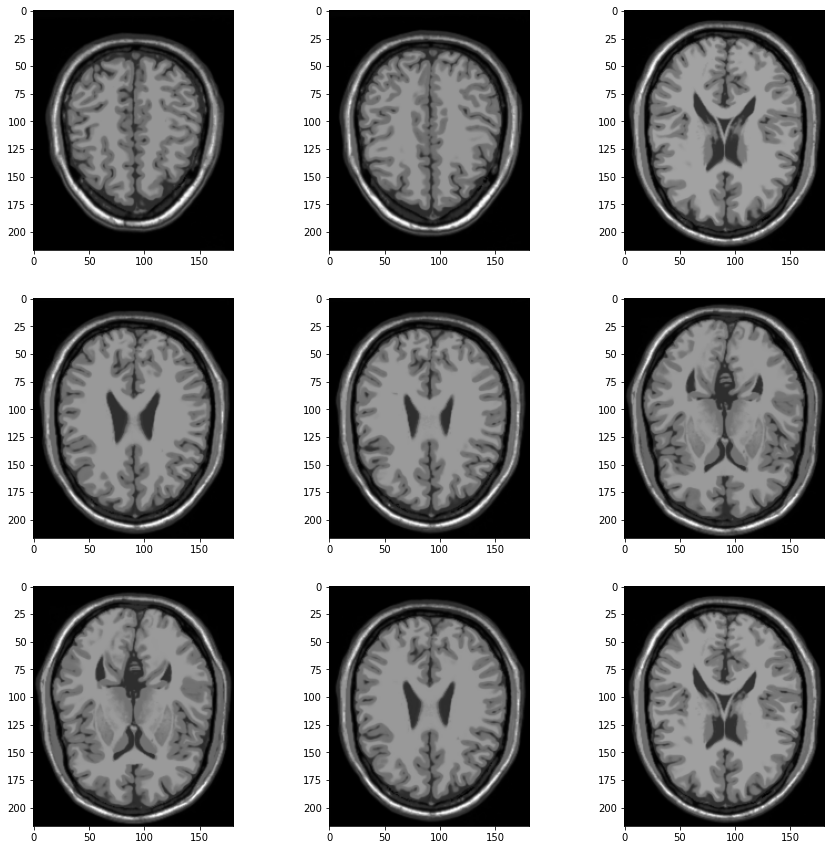

In [10]:
# Visualizing data from T1 dataset
plt.figure(figsize=(15, 15))
for images in images_T1.take(1):
  print("T1 data examples")
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))

T2 data examples



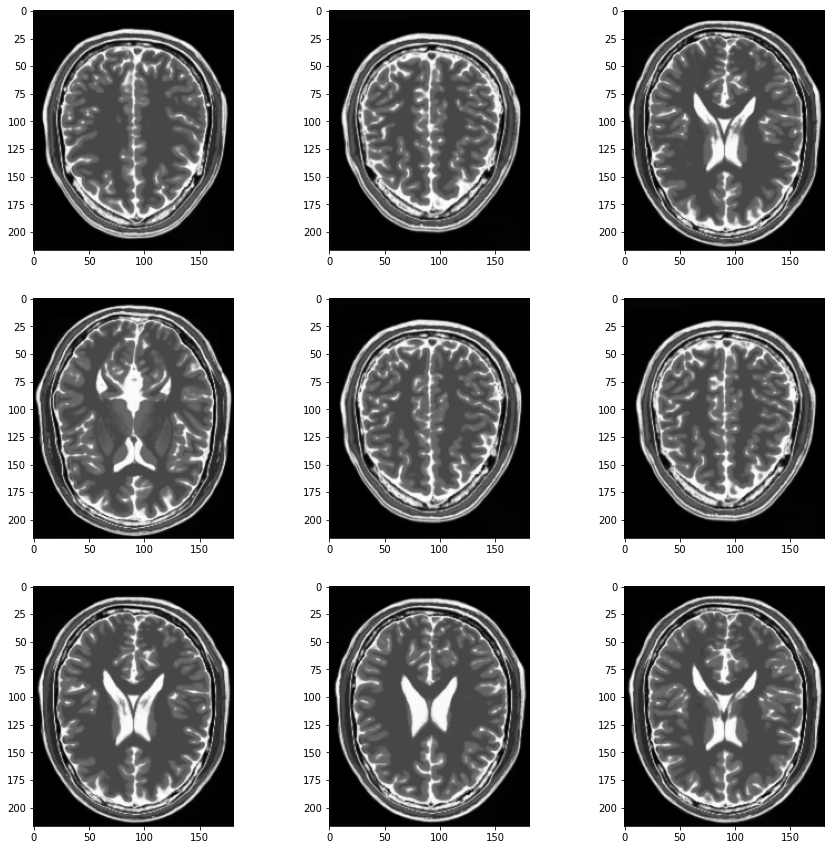

In [11]:
# Visualizing data from T2 dataset
plt.figure(figsize=(15, 15))
for images in images_T2.take(1):
  print("T2 data examples\n")
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))

In [12]:
# Pixel range check for T1 folder images
image_t1_folder = next(iter(images_T1))
random_image = image_t1_folder[0]
print("T1 data pixel value range: ", np.min(random_image), np.max(random_image))

T1 data pixel value range:  0.0 255.0


In [13]:
# Checking range of values of the pixels making up the image in T2 data
image_t2_folder = next(iter(images_T2))
random_image = image_t2_folder[2]
print("T2 data pixel value range: ", np.min(random_image), np.max(random_image))

T2 data pixel value range:  0.0 255.0


## **2. Image Preprocessing**
Data Normalization, Resizing, Reshaping, 
Batch and Shuffle Data


### **1.Data Normalization**

In [14]:
# Defining normalization function - Normalizing data in the range [-1.0, 1.0]
normalization_layer = layers.experimental.preprocessing.Rescaling(scale = 1./127.5, offset =-1.0)

In [15]:
# Normalizing T1 data
images_T1_norm = images_T1.map(lambda x: (normalization_layer(x)))
image_batch1 = next(iter(images_T1_norm))
first_image = image_batch1[0]
print("Minimum and maximum pixel values after normalization")
print(np.min(first_image), np.max(first_image))

Minimum and maximum pixel values after normalization
-1.0 1.0


In [16]:
images_T1_batch  = next(iter(images_T1_norm))
images_T1_batch.shape

TensorShape([43, 217, 181, 3])

In [17]:
images_T1_batch  = next(iter(images_T1_norm))
images_T1_batch.shape

TensorShape([43, 217, 181, 3])

T1 data examples after normalization


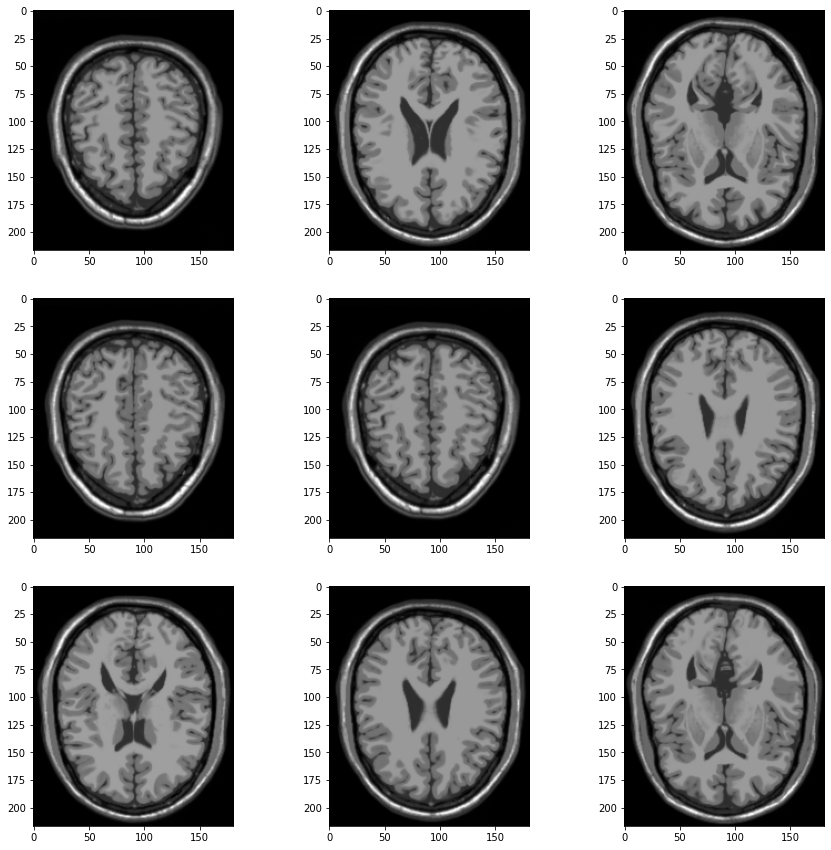

In [18]:
# Visualization T1 dataset after normalization
plt.figure(figsize=(15, 15))
for images in images_T1_norm.take(1):
  print("T1 data examples after normalization")
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow((images[i] * 127.5 + 127.5).numpy().astype("uint8"))   # Reversing the scaling for visualization

In [19]:
# Normalizing T2 data
images_T2_norm = images_T2.map(lambda x: (normalization_layer(x)))
image_batch2 = next(iter(images_T2_norm))
first_image = image_batch2[0]
print("Minimum and maximum pixel values after normalization")
print(np.min(first_image), np.max(first_image))
images_T2_batch  = next(iter(images_T2_norm))
images_T2_batch.shape

Minimum and maximum pixel values after normalization
-1.0 1.0


TensorShape([46, 217, 181, 3])

T2 data examples after normalization


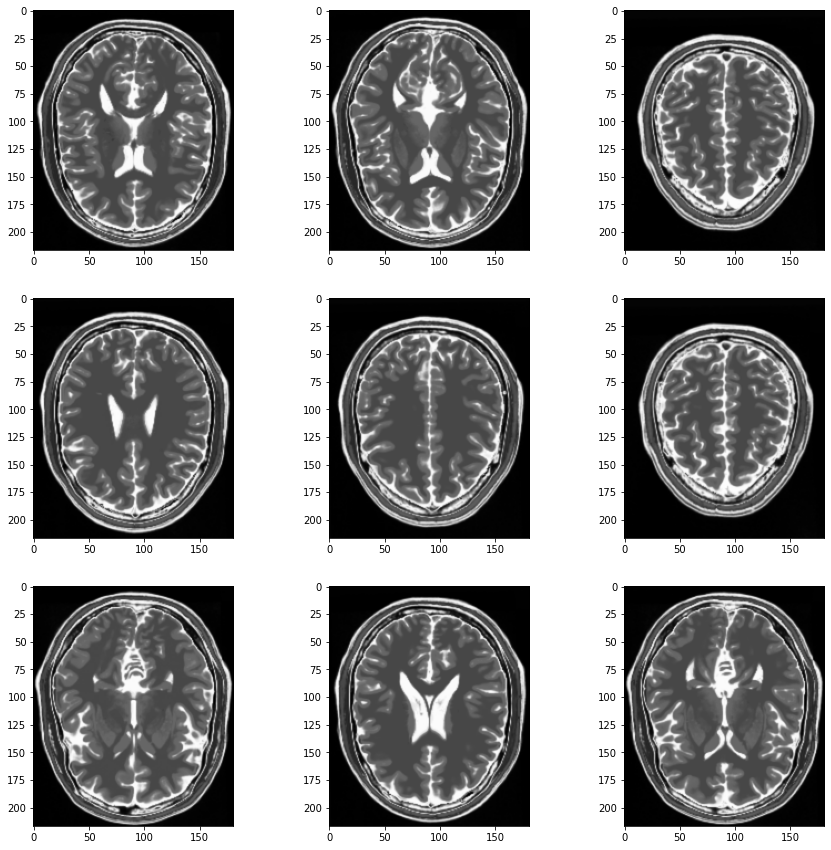

In [20]:
# Visualization T2 dataset after normalization
plt.figure(figsize=(15, 15))
for images in images_T2_norm.take(1):
  print("T2 data examples after normalization")
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow((images[i] * 127.5 + 127.5).numpy().astype("uint8")) 

### **2.Data Resizing to (128,128)**
Resizing to a dimensions for optimal usage of memory.

Shape of resized images:  (128, 128, 3) 



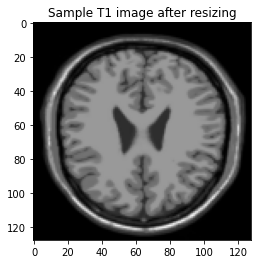

In [21]:
# Define resizing function
resize_layer = layers.experimental.preprocessing.Resizing(128, 128, interpolation='bilinear')

# Resizing T1 data
resized_images_T1 = images_T1_norm.map(lambda x: (resize_layer(x)))

# Obtaining a batch of T1 data.
image_batch = next(iter(resized_images_T1))
first_image = image_batch[0]
print("Shape of resized images: ",first_image.shape,"\n")

# Plotting the first image in the batch of T1 data.
plt.imshow((first_image * 127.5 + 127.5).numpy().astype("uint8"))   # Reversing the scaling for visualization
plt.title("Sample T1 image after resizing")
plt.show()

Shape of resized images:  (128, 128, 3) 



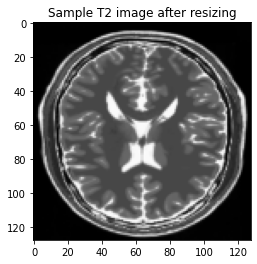

In [22]:
# Resizing T2 data
resized_images_T2 = images_T2_norm.map(lambda x: (resize_layer(x)))

# Obtaining a batch of T2 data.
image_batch = next(iter(resized_images_T2))
first_image = image_batch[0]
print("Shape of resized images: ",first_image.shape,"\n")

# Plotting the first image in the batch of T2 data.
plt.imshow((first_image * 127.5 + 127.5).numpy().astype("uint8"))   # Reversing the scaling for visualization
plt.title("Sample T2 image after resizing")
plt.show()

### **3. Reshaping**

**Reshaping to single channel**

Images are grayscale so no need to keep RGB, this step will help in reducing the time of training later.

In [23]:
reshape_layer = layers.Reshape((128,128,1))

(43, 128, 128, 1)
Shape of reshaped images:  (128, 128, 1) 



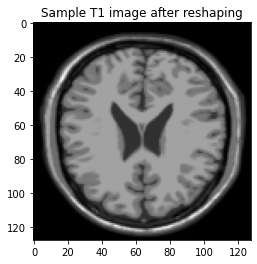

In [24]:
images_T1_reshaped = resized_images_T1.map(lambda x : reshape_layer(x[:,:,:,0]))

image_batch = next(iter(images_T1_reshaped))
print(image_batch.shape)
first_image = image_batch[0]
print("Shape of reshaped images: ",first_image.shape,"\n")

# Plotting the first image in the batch of T1 data.
plt.imshow(first_image.numpy()[:, :, 0], cmap='gray')
plt.title("Sample T1 image after reshaping")
plt.show()

(46, 128, 128, 1)
Shape of reshaped images:  (128, 128, 1) 



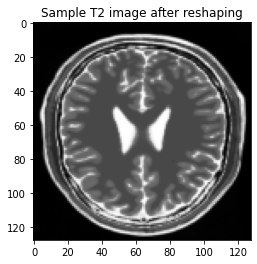

In [25]:
images_T2_reshaped = resized_images_T2.map(lambda x : reshape_layer(x[:,:,:,0]))

image_batch = next(iter(images_T2_reshaped))
print(image_batch.shape)
first_image = image_batch[0]
print("Shape of reshaped images: ",first_image.shape,"\n")

# Plotting the first image in the batch of T1 data.
plt.imshow(first_image.numpy()[:, :, 0], cmap='gray')
plt.title("Sample T2 image after reshaping")
plt.show()

### **4. Batch and reshuffle data**


Shuffling the data to remove any continuity bias.

Shape of T1 image batch:  (43, 128, 128, 1)
Shape of individual images:  (128, 128, 1) 



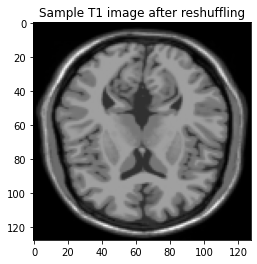

In [26]:
# A buffer size higher than the number of data samples allows effective shuffling
BUFFER_SIZE = 64
# Shuffling the data
T1_data = images_T1_reshaped.shuffle(BUFFER_SIZE)
T2_data = images_T2_reshaped.shuffle(BUFFER_SIZE)

# Obtaining a batch of T1 data.
image_batch = next(iter(T1_data))
print("Shape of T1 image batch: ", image_batch.shape)
first_image = image_batch[0]
print("Shape of individual images: ",first_image.shape,"\n")

# Plotting the first image in the batch of T1 data.
plt.imshow(first_image.numpy()[:, :, 0], cmap='gray')
plt.title("Sample T1 image after reshuffling")
plt.show()

Shape of T2 image batch:  (46, 128, 128, 1)
Shape of individual images:  (128, 128, 1) 



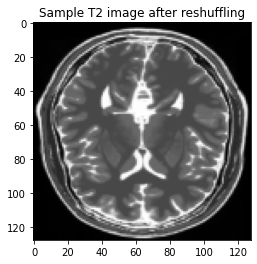

In [27]:
# Obtaining a batch of T2 data.
image_batch = next(iter(T2_data))
print("Shape of T2 image batch: ", image_batch.shape)
first_image = image_batch[0]
print("Shape of individual images: ",first_image.shape,"\n")

# Plotting the first image in the batch of T2 data.
plt.imshow(first_image.numpy()[:, :, 0], cmap='gray')
plt.title("Sample T2 image after reshuffling")
plt.show()

# **3. Model Building**
Steps:

a) Instance Normalization

b) Downsampling, Upsampling and Unet

c) Generator Building using Unet

d) Discriminator Building


### **Instance Normalization**

Instance version normalizes each element of the batch independently, i.e., across spatial locations only.

In [28]:
class InstanceNormalization(tf.keras.layers.Layer):
    # Initialization of Objects
    def __init__(self, epsilon=1e-5):
        # calling parent's init
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon
    
    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)
    
    def call(self, x):
        # Compute Mean and Variance, Axes=[1,2] ensures Instance Normalization
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

### **Downsampling**

To reduce the dimension with each new layer

In [29]:
def downsample(filters, size, apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Conv2d layer
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))
    # Add Normalization layer
    if apply_norm:
        result.add(InstanceNormalization())
    # Add Leaky Relu Activation
    result.add(tf.keras.layers.LeakyReLU())
    return result

### **Upsampling**

Upsampling layer is a simple layer with no weights that will double the dimensions of input and can be used in a generative model when followed by a traditional convolutional layer.

In [30]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Transposed Conv2d layer
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                               kernel_initializer=initializer, use_bias=False))
    # Add Normalization Layer
    result.add(InstanceNormalization())
    # Conditionally add Dropout layer
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    # Add Relu Activation Layer
    result.add(tf.keras.layers.ReLU())
    return result

### **Generator Building using Unet**

UNET basically used in image segmentation problems where the input and output dimensions are same. GAN tries to generate new images from a random noise. So the generator of the gan have very few dimension in input but output is in large dimension. We can use UNET as the generator in the GAN.

-Use **Downsampling** on Input Image to learn the latent characteristics of input image

-Then use **Upsampling** to use this knowledge to translate it into another image.

Note - Every downlsampling layer has a upsampling layer except the last downsampling layer (bottleneck layer). The background information is retained by skip connections.


In [31]:
# Unet Generator is a combination of Convolution + Transposed Convolution Layers
def unet_generator():
    down_stack = [
        downsample(64, 4, True), # (bs, 64, 64, 64)
        downsample(64, 4),        # (bs, 32, 32, 64)
        downsample(128, 4),       # (bs, 16, 16, 128)
        downsample(128, 4),       # (bs, 8, 8, 128)
        downsample(256, 4),       # (bs, 4, 4, 256)
        downsample(256, 4),       # (bs, 2, 2, 256)
        downsample(512, 4)        # Bottleneck layer (bs, 1, 1, 512)
    ]
    up_stack = [
        upsample(256, 4, True),   # (bs, 2, 2, 256)
        upsample(256, 4),         # (bs, 4, 4, 256)
        upsample(128, 4),         # (bs, 8, 8, 128)
        upsample(128, 4),         # (bs, 16, 16,128)
        upsample(64, 4),          # (bs, 32, 32, 64)
        upsample(64, 4)           # (bs, 64, 64, 64)
    ]
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(1, 4, strides=2, padding='same', kernel_initializer=initializer,
                                           activation='tanh') # (bs, 128, 128, 1)
    
    # Apply skip connections
    concat = tf.keras.layers.Concatenate()
    inputs = tf.keras.layers.Input(shape=[128, 128, 1])
    x = inputs
    
    # Downsampling through the model
    skips = []                # List to store downsampling layers' latent information
    for down in down_stack:
        x = down(x)
        skips.append(x)
    
    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])       # Concat skip connections with Up-sampling layers
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

In [32]:
# Defining generator models - The generator models for both the image types have identical structures.
generator_T1 = unet_generator()   # For generating T1 images 
generator_T2 = unet_generator()   # For generating T2 images 

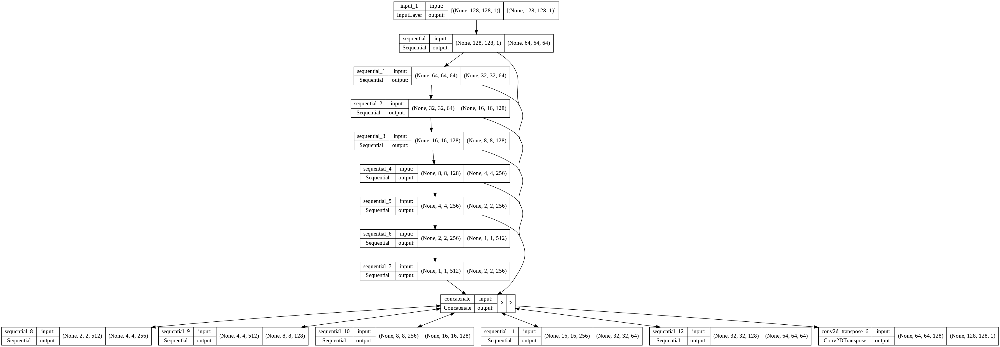

In [33]:
# Visualize generator model architecture
plot_model(generator_T1, show_shapes=True, show_layer_names=True)

In [34]:
generator_T2.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 sequential_13 (Sequential)     (None, 64, 64, 64)   1152        ['input_2[0][0]']                
                                                                                                  
 sequential_14 (Sequential)     (None, 32, 32, 64)   65664       ['sequential_13[0][0]']          
                                                                                                  
 sequential_15 (Sequential)     (None, 16, 16, 128)  131328      ['sequential_14[0][0]']    

### **Discriminator Building**

The discriminator in a GAN is simply a classifier. It tries to distinguish real data from the data created by the generator. It could use any network architecture appropriate to the type of data it's classifying.

In [35]:
# Discriminators only contain Convolutional layers and no Transposed Convolution is used.
def discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    # add input layer of size (128, 128, 1)
    inp = tf.keras.layers.Input(shape=[128, 128, 1], name='input_image')
    x = inp
    
    # add downsampling step here
    down1 = downsample(64, 4, False)(x)                 # (bs, 64, 64, 64)
    down2_intermediate = downsample(128, 4)(down1)      # (bs, 32, 32, 128)
    down3_intermediate = downsample(256, 4)(down2_intermediate) # (bs, 16, 16, 256)
    down4 = downsample(512, 4)(down3_intermediate)      # (bs, 8, 8, 512)
    
    # Adding a zero-padding layer
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down4)  # (bs, 10, 10, 512)
    
    # implement a concrete downsampling layer here
    conv = tf.keras.layers.Conv2D(256, 4, strides=1, kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1)  # (bs, 7, 7, 256)
    norm1 = InstanceNormalization()(conv)                     # (bs, 7, 7, 256)
    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)           # (bs, 7, 7, 256)
    
    # Adding another zero padding layer
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)   # (bs, 9, 9, 256)
    
    # add a last pure 2D Convolution layer
    last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2)   # (bs, 6, 6, 1 )
    
    return tf.keras.Model(inputs=inp, outputs=last)

In [36]:
# Defining discriminators
discriminator_T1 = discriminator()
discriminator_T2 = discriminator()

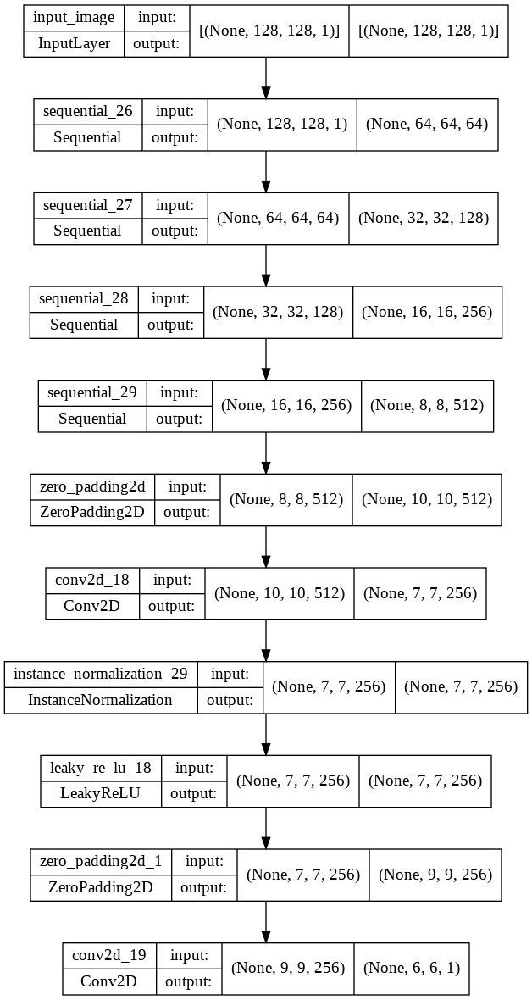

In [37]:
# Visualize discriminator model architecture
plot_model(discriminator_T1, show_shapes=True, show_layer_names=True)

In [38]:
discriminator_T2.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 128, 128, 1)]     0         
                                                                 
 sequential_30 (Sequential)  (None, 64, 64, 64)        1024      
                                                                 
 sequential_31 (Sequential)  (None, 32, 32, 128)       131328    
                                                                 
 sequential_32 (Sequential)  (None, 16, 16, 256)       524800    
                                                                 
 sequential_33 (Sequential)  (None, 8, 8, 512)         2098176   
                                                                 
 zero_padding2d_2 (ZeroPaddi  (None, 10, 10, 512)      0         
 ng2D)                                                           
                                                           

**To Check output of untrained generator**


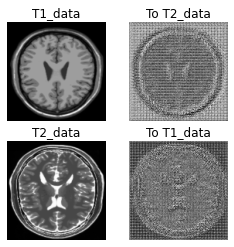

In [39]:
sample_T1_data = next(iter(T1_data))
sample_T2_data = next(iter(T2_data))

to_T2_data = generator_T2(sample_T1_data)   # Generating T2 from T1 data
to_T1_data = generator_T1(sample_T2_data)   # Generating T1 from T2 data

plt.figure(figsize=(4, 4))

imgs = [sample_T1_data, to_T2_data, sample_T2_data, to_T1_data]
title = ['T1_data', 'To T2_data', 'T2_data', 'To T1_data']

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    plt.imshow(imgs[i][0].numpy()[:, :, 0], cmap='gray')
    plt.axis('off')
plt.show()

## **4. Model Training**
*Steps*- 

Declare Loss type ->
 Calculate Discriminator Loss  ->
Calculate Generator Loss ->
 Cycle Loss  -> 
Identity Loss  -> Optimizer  -> 
Checkpoint Initialization  -> Training Flow

### **1 .Declare Loss type**
Declare Loss as Binary Cross

In [40]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

### **2. Discriminator Loss**

It consists of two types of losses

1. Loss on Real Data

2. Loss on Fake Data

In [41]:
def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5      # mean of losses

### **3. Calculate Generator Loss**

In [42]:
def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

### **4. Cycle Loss**


In [43]:
def calc_cycle_loss(real_image, cycled_image):
    cycle_loss = tf.reduce_mean(tf.abs(real_image - cycled_image))  # Averages out all values in the input
    return 10.0 * cycle_loss  

### **5. Identity Loss**

In [44]:
def identity_loss(real_image, same_image):
    id_loss = tf.reduce_mean(tf.abs(real_image - same_image))       # Averages out all values in the input
    return 2.0 * id_loss  

### **6. Define Optimizer**

In [45]:
#optimizer define
generator_T1_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_T2_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_T1_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_T2_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

### **7. Checkpoint Initialization**

In order to save models

In [46]:
# Directory to keep Checkpoints at each epoch
if not os.path.isdir('training_checkpoints'):
    os.mkdir('training_checkpoints')

checkpoint_path = "./training_checkpoints"

ckpt = tf.train.Checkpoint(generator_T1=generator_T1,
                           generator_T2=generator_T2,
                           discriminator_T1=discriminator_T1,
                           discriminator_T2=discriminator_T2,
                           generator_T1_optimizer=generator_T1_optimizer,
                           generator_T2_optimizer=generator_T2_optimizer,
                           discriminator_T1_optimizer=discriminator_T1_optimizer,
                           discriminator_T2_optimizer=discriminator_T2_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=3)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

In [47]:
# Directory to keep Generated Images each epoch
if not os.path.isdir('generated_images'):
    os.mkdir('generated_images')

# Function to show Images output by Generators while Training
def generate_images(model1, test_input1, model2, test_input2, epoch):
    prediction1 = model1(test_input1)
    prediction2 = model2(test_input2)
    plt.figure(figsize=(4, 4))
    display_list = [test_input1[0], prediction1[0], test_input2[0], prediction2[0]]
    title = ['Input T1', 'Predicted T2 - Epoch ' + str(epoch), 'Input T2', 'Predicted T1 - Epoch ' + str(epoch)]
    for i in range(4):
        plt.subplot(2, 2, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i].numpy()[:, :, 0], cmap='gray')
        plt.axis('off')

    plt.savefig('./generated_images/image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

### **7. Training Flow**

The steps involved are- 

a) **Generate Fake T2** and Cycled T1

b) **Generate Fake T1** and Cycled T2

c) **Generate Fake Images** through T1 and T2 for Identity Loss.

d) **Calculate Discriminator Loss** for Disc T1 and Disc T2 on Fake Data for Generator Training.

e) **Calculate Generator Loss** on Discriminator.

f) **Calculate Cycled Loss** on Cycled Images from step a and b.

g) **Calculate Total Generator Loss** - Disc Loss + Cycled Loss + Identity Loss

h) **Calculate Discriminator Loss on both Fake and Real Images** for Disc X and Y for Disc Training.

i) **Calculate the Gradients and update the weight and bias of models**.

In [48]:
@tf.function
def train_step(real_T1, real_T2):
    # persistent is set to True because the tape is used more than once to calculate the gradients.
    with tf.GradientTape(persistent=True) as tape:
        # Generator T2 translates T1 -> T2
        # Generator T1 translates T2 -> T1
        fake_T2 = generator_T2(real_T1, training=True)
        cycled_T1 = generator_T1(fake_T2, training=True)
        
        fake_T1 = generator_T1(real_T2, training=True)
        cycled_T2 = generator_T2(fake_T1, training=True)
        
        # same_x and same_y are used for identity loss.
        same_T1 = generator_T1(real_T1, training=True)
        same_T2 = generator_T2(real_T2, training=True)
        
        disc_real_T1 = discriminator_T1(real_T1, training=True)
        disc_real_T2 = discriminator_T2(real_T2, training=True)
        
        disc_fake_T1 = discriminator_T1(fake_T1, training=True)
        disc_fake_T2 = discriminator_T2(fake_T2, training=True)
        
        # calculate generator loss
        gen_T2_loss = generator_loss(disc_fake_T2)
        gen_T1_loss = generator_loss(disc_fake_T1)
        
        # Calculate cycle loss
        total_cycle_loss = calc_cycle_loss(real_T1, cycled_T1) + calc_cycle_loss(real_T2, cycled_T2)
        
        # Total generator loss = BCE loss + cycle loss + identity loss
        total_gen_T1_loss = gen_T1_loss + total_cycle_loss + identity_loss(real_T1, same_T1)
        total_gen_T2_loss = gen_T2_loss + total_cycle_loss + identity_loss(real_T2, same_T2)
        
        # Discriminator's loss
        disc_T1_loss = discriminator_loss(disc_real_T1, disc_fake_T1)
        disc_T2_loss = discriminator_loss(disc_real_T2, disc_fake_T2)
        
    # Calculate the gradients for generator and discriminator
    generator_T1_gradients = tape.gradient(total_gen_T1_loss, generator_T1.trainable_variables)
    generator_T2_gradients = tape.gradient(total_gen_T2_loss, generator_T2.trainable_variables)
    
    discriminator_T1_gradients = tape.gradient(disc_T1_loss, discriminator_T1.trainable_variables)
    discriminator_T2_gradients = tape.gradient(disc_T2_loss, discriminator_T2.trainable_variables)
    
    # Apply the gradients to the optimizer
    generator_T1_optimizer.apply_gradients(zip(generator_T1_gradients, generator_T1.trainable_variables))
    generator_T2_optimizer.apply_gradients(zip(generator_T2_gradients, generator_T2.trainable_variables))
    
    discriminator_T1_optimizer.apply_gradients(zip(discriminator_T1_gradients, discriminator_T1.trainable_variables))
    discriminator_T2_optimizer.apply_gradients(zip(discriminator_T2_gradients, discriminator_T2.trainable_variables))

## **Train the CycleGAN Model for 100 Epochs**



Loop training function for number of epochs and also show the output at each step.

In [49]:
for image_x in T1_data:
    for image_y in T2_data:
        print(image_x.shape, image_y.shape)

(43, 128, 128, 1) (46, 128, 128, 1)


In [50]:
# Declaring number of epochs of training
EPOCHS = 100

I choosed 100 epochs as it seems optimum considering the google collabs free RAM and disk space constrain.

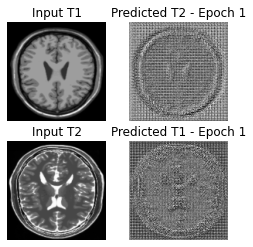

Saving checkpoint for epoch 1 at ./training_checkpoints/ckpt-1


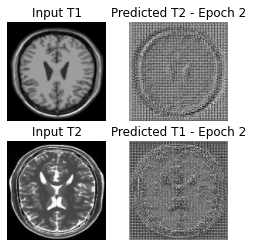

Saving checkpoint for epoch 2 at ./training_checkpoints/ckpt-2


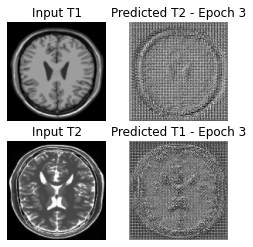

Saving checkpoint for epoch 3 at ./training_checkpoints/ckpt-3


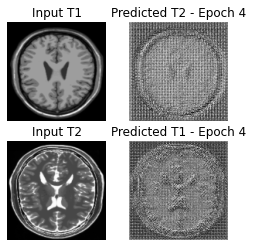

Saving checkpoint for epoch 4 at ./training_checkpoints/ckpt-4


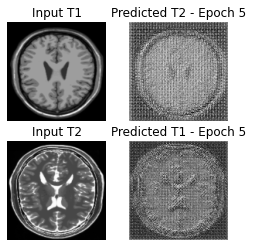

Saving checkpoint for epoch 5 at ./training_checkpoints/ckpt-5


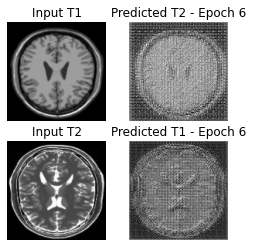

Saving checkpoint for epoch 6 at ./training_checkpoints/ckpt-6


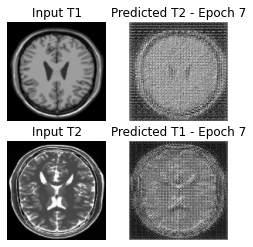

Saving checkpoint for epoch 7 at ./training_checkpoints/ckpt-7


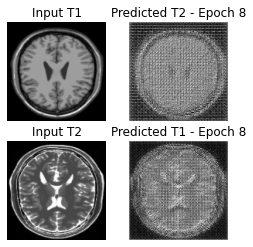

Saving checkpoint for epoch 8 at ./training_checkpoints/ckpt-8


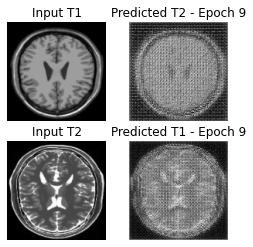

Saving checkpoint for epoch 9 at ./training_checkpoints/ckpt-9


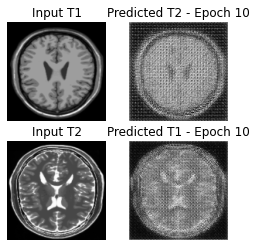

Saving checkpoint for epoch 10 at ./training_checkpoints/ckpt-10


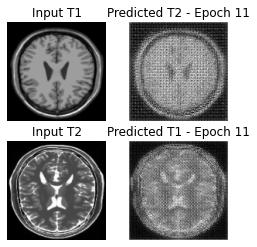

Saving checkpoint for epoch 11 at ./training_checkpoints/ckpt-11


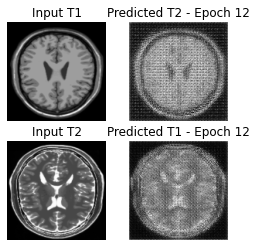

Saving checkpoint for epoch 12 at ./training_checkpoints/ckpt-12


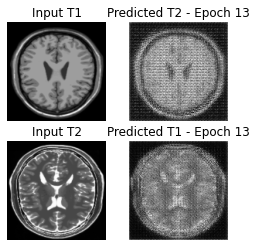

Saving checkpoint for epoch 13 at ./training_checkpoints/ckpt-13


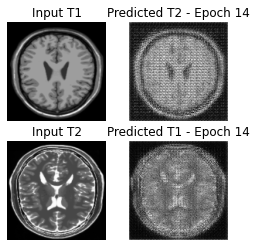

Saving checkpoint for epoch 14 at ./training_checkpoints/ckpt-14


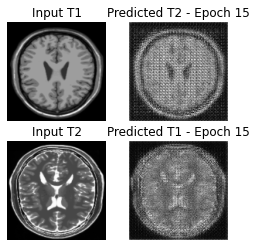

Saving checkpoint for epoch 15 at ./training_checkpoints/ckpt-15


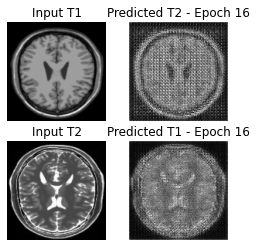

Saving checkpoint for epoch 16 at ./training_checkpoints/ckpt-16


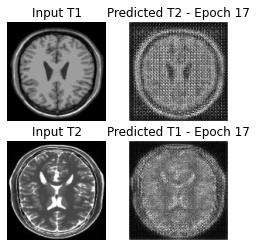

Saving checkpoint for epoch 17 at ./training_checkpoints/ckpt-17


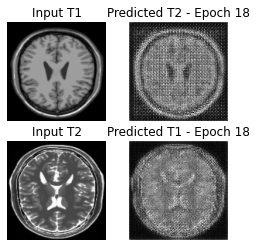

Saving checkpoint for epoch 18 at ./training_checkpoints/ckpt-18


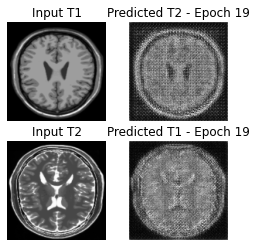

Saving checkpoint for epoch 19 at ./training_checkpoints/ckpt-19


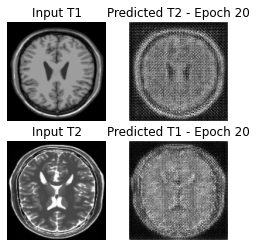

Saving checkpoint for epoch 20 at ./training_checkpoints/ckpt-20


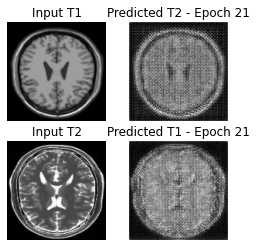

Saving checkpoint for epoch 21 at ./training_checkpoints/ckpt-21


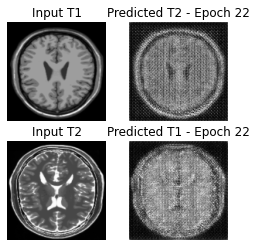

Saving checkpoint for epoch 22 at ./training_checkpoints/ckpt-22


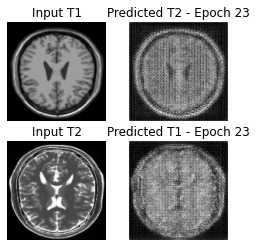

Saving checkpoint for epoch 23 at ./training_checkpoints/ckpt-23


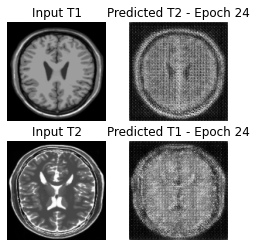

Saving checkpoint for epoch 24 at ./training_checkpoints/ckpt-24


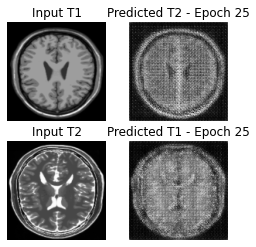

Saving checkpoint for epoch 25 at ./training_checkpoints/ckpt-25


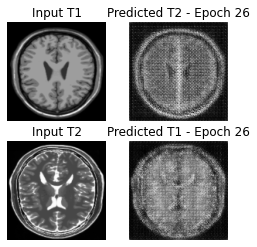

Saving checkpoint for epoch 26 at ./training_checkpoints/ckpt-26


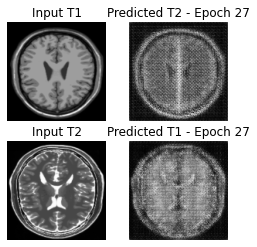

Saving checkpoint for epoch 27 at ./training_checkpoints/ckpt-27


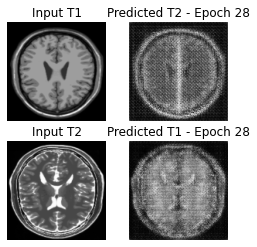

Saving checkpoint for epoch 28 at ./training_checkpoints/ckpt-28


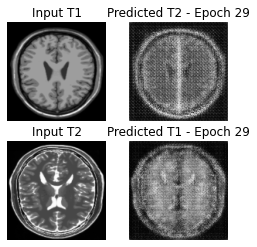

Saving checkpoint for epoch 29 at ./training_checkpoints/ckpt-29


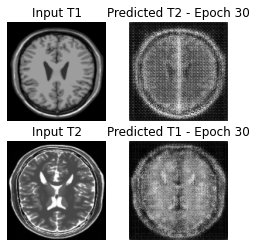

Saving checkpoint for epoch 30 at ./training_checkpoints/ckpt-30


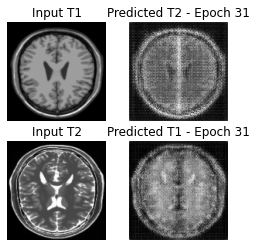

Saving checkpoint for epoch 31 at ./training_checkpoints/ckpt-31


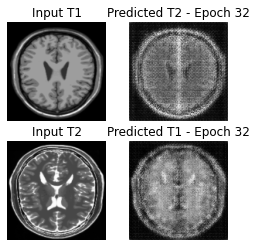

Saving checkpoint for epoch 32 at ./training_checkpoints/ckpt-32


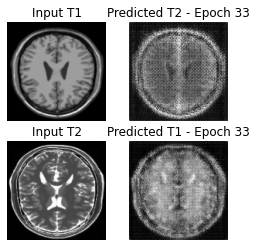

Saving checkpoint for epoch 33 at ./training_checkpoints/ckpt-33


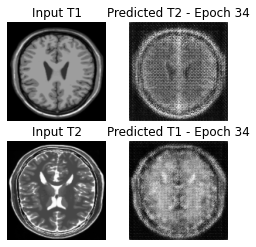

Saving checkpoint for epoch 34 at ./training_checkpoints/ckpt-34


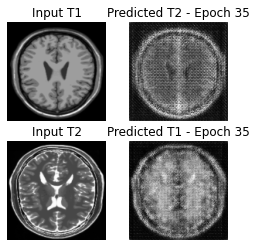

Saving checkpoint for epoch 35 at ./training_checkpoints/ckpt-35


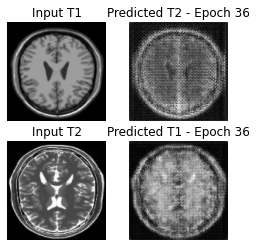

Saving checkpoint for epoch 36 at ./training_checkpoints/ckpt-36


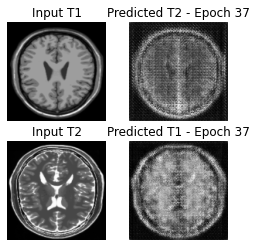

Saving checkpoint for epoch 37 at ./training_checkpoints/ckpt-37


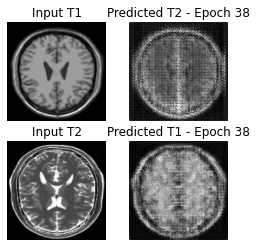

Saving checkpoint for epoch 38 at ./training_checkpoints/ckpt-38


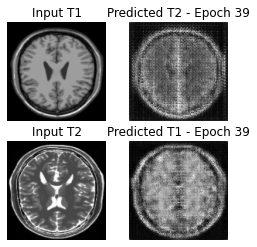

Saving checkpoint for epoch 39 at ./training_checkpoints/ckpt-39


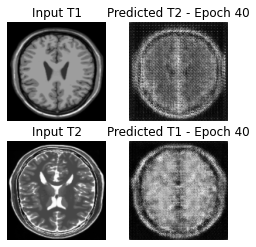

Saving checkpoint for epoch 40 at ./training_checkpoints/ckpt-40


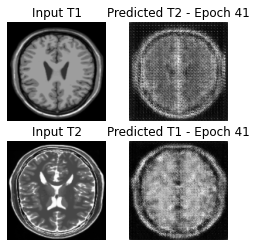

Saving checkpoint for epoch 41 at ./training_checkpoints/ckpt-41


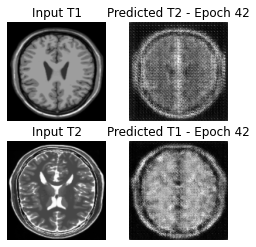

Saving checkpoint for epoch 42 at ./training_checkpoints/ckpt-42


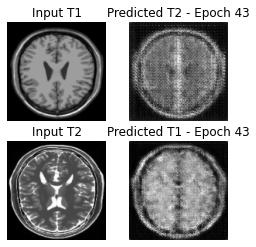

Saving checkpoint for epoch 43 at ./training_checkpoints/ckpt-43


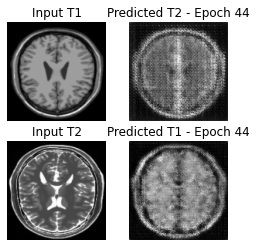

Saving checkpoint for epoch 44 at ./training_checkpoints/ckpt-44


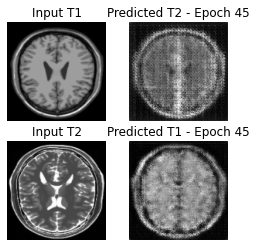

Saving checkpoint for epoch 45 at ./training_checkpoints/ckpt-45


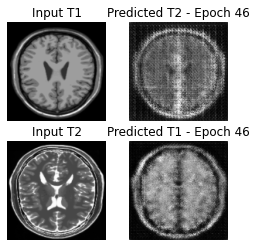

Saving checkpoint for epoch 46 at ./training_checkpoints/ckpt-46


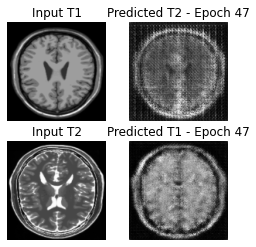

Saving checkpoint for epoch 47 at ./training_checkpoints/ckpt-47


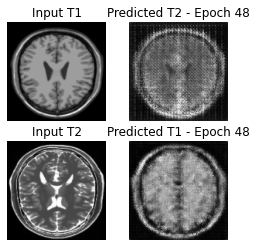

Saving checkpoint for epoch 48 at ./training_checkpoints/ckpt-48


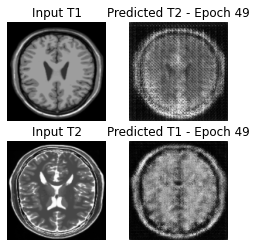

Saving checkpoint for epoch 49 at ./training_checkpoints/ckpt-49


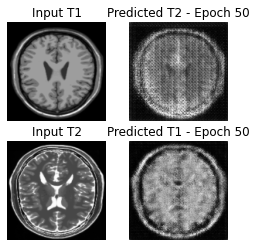

Saving checkpoint for epoch 50 at ./training_checkpoints/ckpt-50


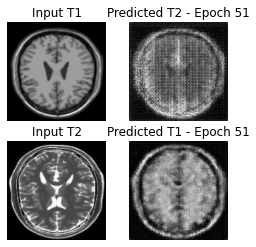

Saving checkpoint for epoch 51 at ./training_checkpoints/ckpt-51


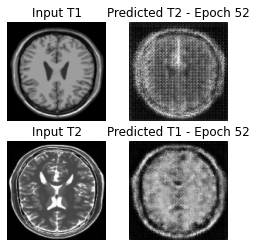

Saving checkpoint for epoch 52 at ./training_checkpoints/ckpt-52


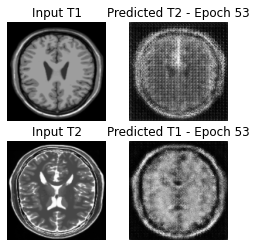

Saving checkpoint for epoch 53 at ./training_checkpoints/ckpt-53


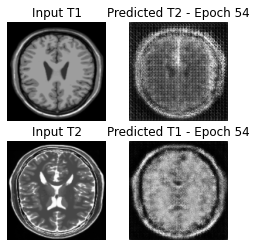

Saving checkpoint for epoch 54 at ./training_checkpoints/ckpt-54


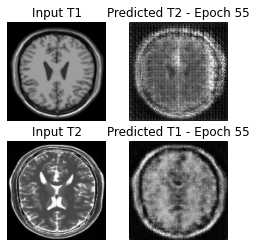

Saving checkpoint for epoch 55 at ./training_checkpoints/ckpt-55


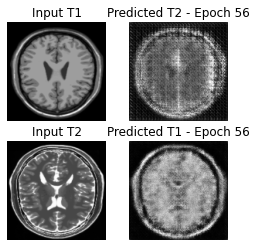

Saving checkpoint for epoch 56 at ./training_checkpoints/ckpt-56


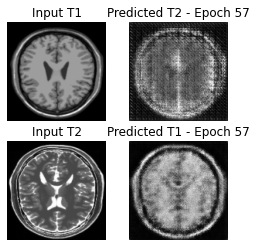

Saving checkpoint for epoch 57 at ./training_checkpoints/ckpt-57


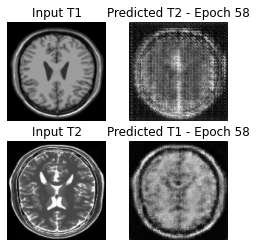

Saving checkpoint for epoch 58 at ./training_checkpoints/ckpt-58


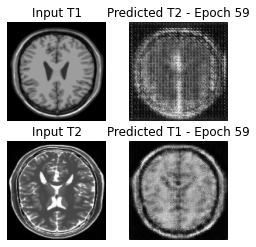

Saving checkpoint for epoch 59 at ./training_checkpoints/ckpt-59


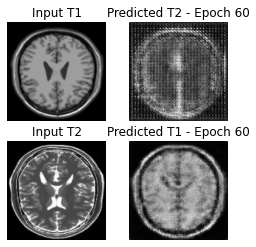

Saving checkpoint for epoch 60 at ./training_checkpoints/ckpt-60


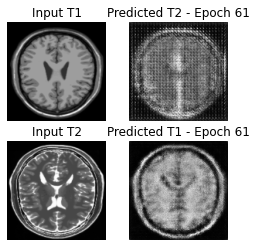

Saving checkpoint for epoch 61 at ./training_checkpoints/ckpt-61


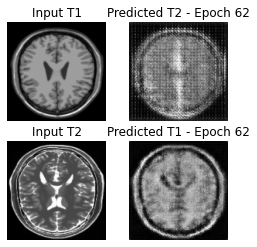

Saving checkpoint for epoch 62 at ./training_checkpoints/ckpt-62


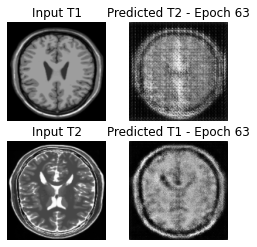

Saving checkpoint for epoch 63 at ./training_checkpoints/ckpt-63


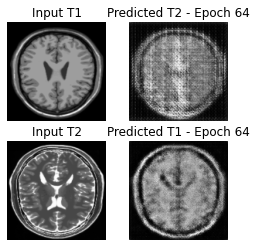

Saving checkpoint for epoch 64 at ./training_checkpoints/ckpt-64


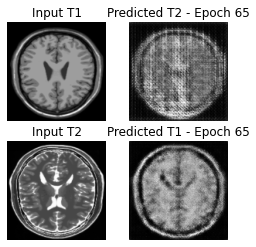

Saving checkpoint for epoch 65 at ./training_checkpoints/ckpt-65


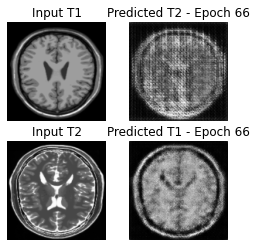

Saving checkpoint for epoch 66 at ./training_checkpoints/ckpt-66


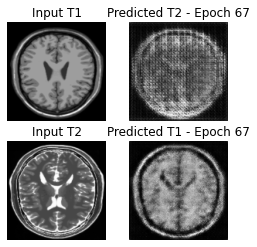

Saving checkpoint for epoch 67 at ./training_checkpoints/ckpt-67


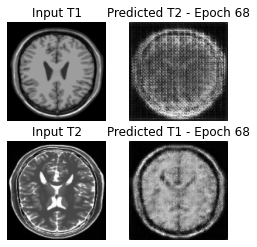

Saving checkpoint for epoch 68 at ./training_checkpoints/ckpt-68


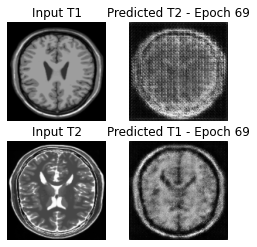

Saving checkpoint for epoch 69 at ./training_checkpoints/ckpt-69


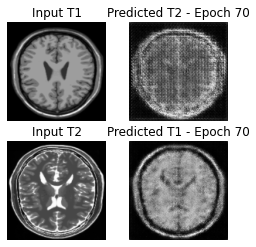

Saving checkpoint for epoch 70 at ./training_checkpoints/ckpt-70


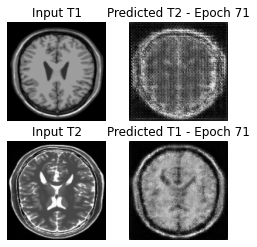

Saving checkpoint for epoch 71 at ./training_checkpoints/ckpt-71


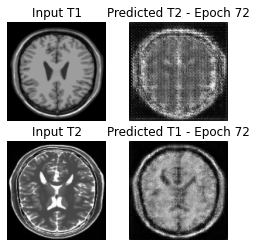

Saving checkpoint for epoch 72 at ./training_checkpoints/ckpt-72


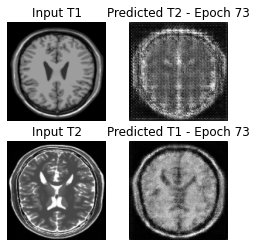

Saving checkpoint for epoch 73 at ./training_checkpoints/ckpt-73


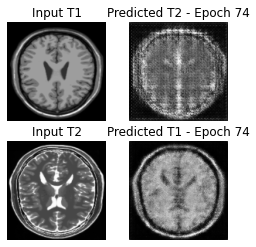

Saving checkpoint for epoch 74 at ./training_checkpoints/ckpt-74


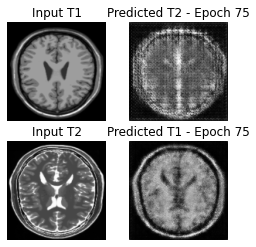

Saving checkpoint for epoch 75 at ./training_checkpoints/ckpt-75


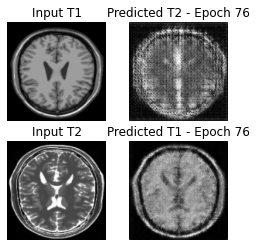

Saving checkpoint for epoch 76 at ./training_checkpoints/ckpt-76


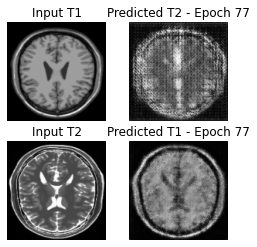

Saving checkpoint for epoch 77 at ./training_checkpoints/ckpt-77


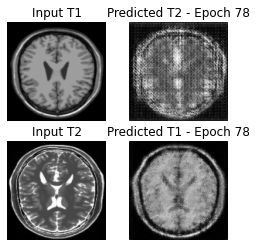

Saving checkpoint for epoch 78 at ./training_checkpoints/ckpt-78


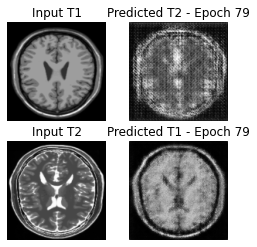

Saving checkpoint for epoch 79 at ./training_checkpoints/ckpt-79


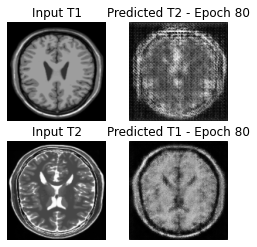

Saving checkpoint for epoch 80 at ./training_checkpoints/ckpt-80


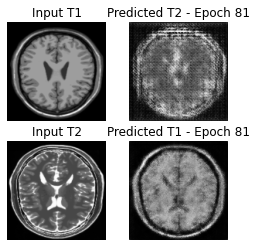

Saving checkpoint for epoch 81 at ./training_checkpoints/ckpt-81


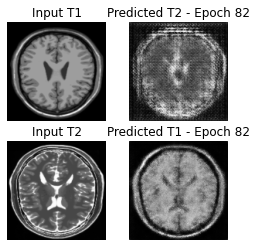

Saving checkpoint for epoch 82 at ./training_checkpoints/ckpt-82


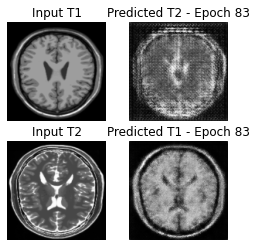

Saving checkpoint for epoch 83 at ./training_checkpoints/ckpt-83


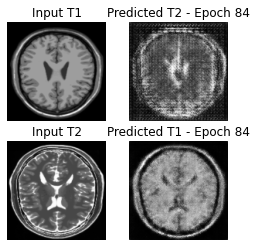

Saving checkpoint for epoch 84 at ./training_checkpoints/ckpt-84


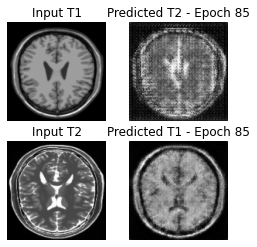

Saving checkpoint for epoch 85 at ./training_checkpoints/ckpt-85


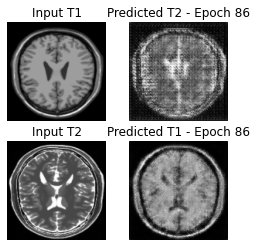

Saving checkpoint for epoch 86 at ./training_checkpoints/ckpt-86


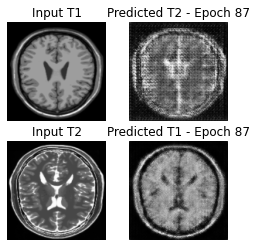

Saving checkpoint for epoch 87 at ./training_checkpoints/ckpt-87


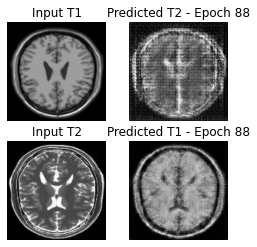

Saving checkpoint for epoch 88 at ./training_checkpoints/ckpt-88


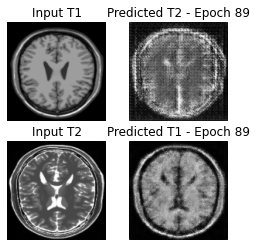

Saving checkpoint for epoch 89 at ./training_checkpoints/ckpt-89


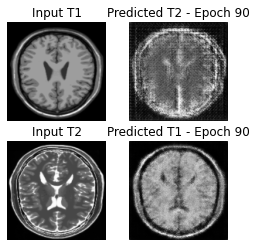

Saving checkpoint for epoch 90 at ./training_checkpoints/ckpt-90


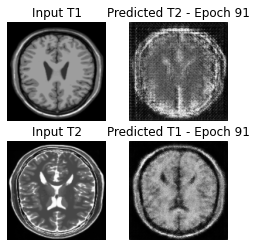

Saving checkpoint for epoch 91 at ./training_checkpoints/ckpt-91


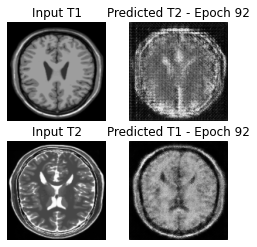

Saving checkpoint for epoch 92 at ./training_checkpoints/ckpt-92


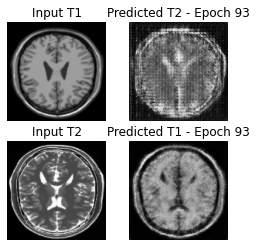

Saving checkpoint for epoch 93 at ./training_checkpoints/ckpt-93


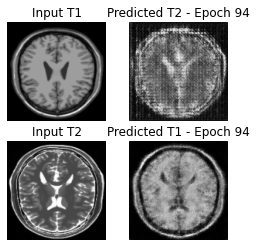

Saving checkpoint for epoch 94 at ./training_checkpoints/ckpt-94


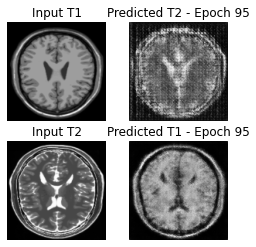

Saving checkpoint for epoch 95 at ./training_checkpoints/ckpt-95


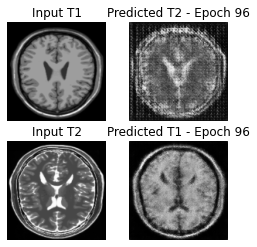

Saving checkpoint for epoch 96 at ./training_checkpoints/ckpt-96


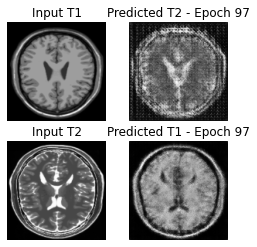

Saving checkpoint for epoch 97 at ./training_checkpoints/ckpt-97


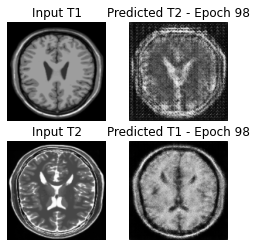

Saving checkpoint for epoch 98 at ./training_checkpoints/ckpt-98


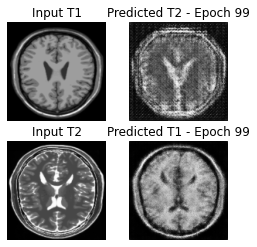

Saving checkpoint for epoch 99 at ./training_checkpoints/ckpt-99


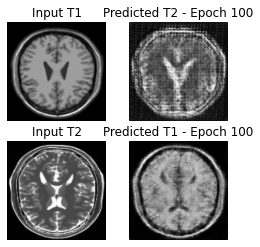

Saving checkpoint for epoch 100 at ./training_checkpoints/ckpt-100


In [51]:
# Training run - Epochs 1 to 100
for epoch in range(1, EPOCHS+1):
    for image_x in T1_data:
        for image_y in T2_data:
            train_step(image_x, image_y)
    generate_images(generator_T2, sample_T1_data, generator_T1, sample_T2_data, epoch)
    ckpt_save_path = ckpt_manager.save()
    print('Saving checkpoint for epoch', epoch, 'at', ckpt_save_path)

It can be seen that upon running 100 epochs, the predicted image look like the input image with other image type.

In [52]:
#Generating a GIF for visualization of Results

anim_file = 'MRI_T1_T2_ver8.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('./generated_images/image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)



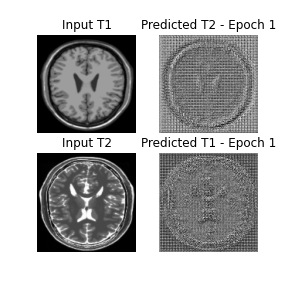

In [54]:
# Visualizing the progress from epoch to epoch 
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

### **Conclusion**

In this capstone, we used CycleGAN to translate the style of one MRI image to another, which will help in a better understanding of the scanned image. Using GANs we saw we can create T2 weighted images from T1 weighted MRI image and vice-versa that will help in better diagnosis. And the patient wont need to go for extra MRI scans, so it will reduce the cost of treatment also.
